In [15]:
#Purva's version:


# Visualizing Ahmedabad

import osmnx as ox
import networkx as nx

# Define city/cities

# Get data for places

'''
places = ["Ahmedabad, India"]
G = ox.graph_from_place(places,  retain_all=True, simplify = True, network_type='all')
'''

point = (22.867094, 71.755439)
G = ox.graph_from_point(point, dist=200000, retain_all=True, simplify = True, network_type='all')

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in G.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    

# List to store colors
roadColors = []
roadWidths = []

for item in data:
    if "length" in item.keys():
        if item["length"] <= 100:
            linewidth = 0.10
            color = "#a6a6a6" 
            
        elif item["length"] > 100 and item["length"] <= 200:
            linewidth = 0.15
            color = "#676767"
            
        elif item["length"] > 200 and item["length"] <= 400:
            linewidth = 0.25
            color = "#454545"
            
        elif item["length"] > 400 and item["length"] <= 800:
            color = "#d5d5d5"
            linewidth = 0.35
        else:
            color = "#ededed"
            linewidth = 0.45
    else:
        color = "#a6a6a6"
        linewidth = 0.10
            
    roadColors.append(color)
    roadWidths.append(linewidth)
            

# Center of map
latitude = 22.867094
longitude = 71.755439



bgcolor = "#061529"

fig, ax = ox.plot_graph(G, node_size=0,figsize=(27, 40), 
                        dpi = 300,bgcolor = bgcolor,
                        save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1, ax=ax)

'''
# Bbox sides
north = latitude + 0.15
south = latitude - 0.15
east = longitude + 0.15
west = longitude - 0.15

fig, ax = ox.plot_graph(G, node_size=0, bbox = (north, south, east, west),
                        dpi = 300,bgcolor = bgcolor,
                        save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1)

'''

fig.tight_layout(pad=0)
#Saves only roadmap
fig.savefig("Gujarat_roadmap.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=False)


G1 = ox.graph_from_point(point, dist=200000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["natural"~"water"]')
G2 = ox.graph_from_point(point, dist=200000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["waterway"~"river"]')
Gwater = nx.compose(G1, G2)


u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in Gwater.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    


# List to store colors
roadColors = []
roadWidths = []

# #72b1b1
# #5dc1b9
for item in data:
    if "name" in item.keys():
        if item["length"] > 400: 
            color = "#5dc1b9"
            linewidth = 5
        else:
            color = "#5dc1b9"
            linewidth = 1.25
    else:
        color = "#5dc1b9"
        linewidth = 0.5
    roadColors.append(color)    
    roadWidths.append(linewidth)



fig, ax = ox.plot_graph(Gwater, node_size=0,figsize=(27, 40), 
                        dpi = 300, save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1, ax=ax)

fig.tight_layout(pad=0)
fig.savefig("Gujarat_drive_and_waterMap_1.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=True)

<Figure size 640x480 with 0 Axes>

c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:85: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(
c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:85: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


<Figure size 640x480 with 0 Axes>

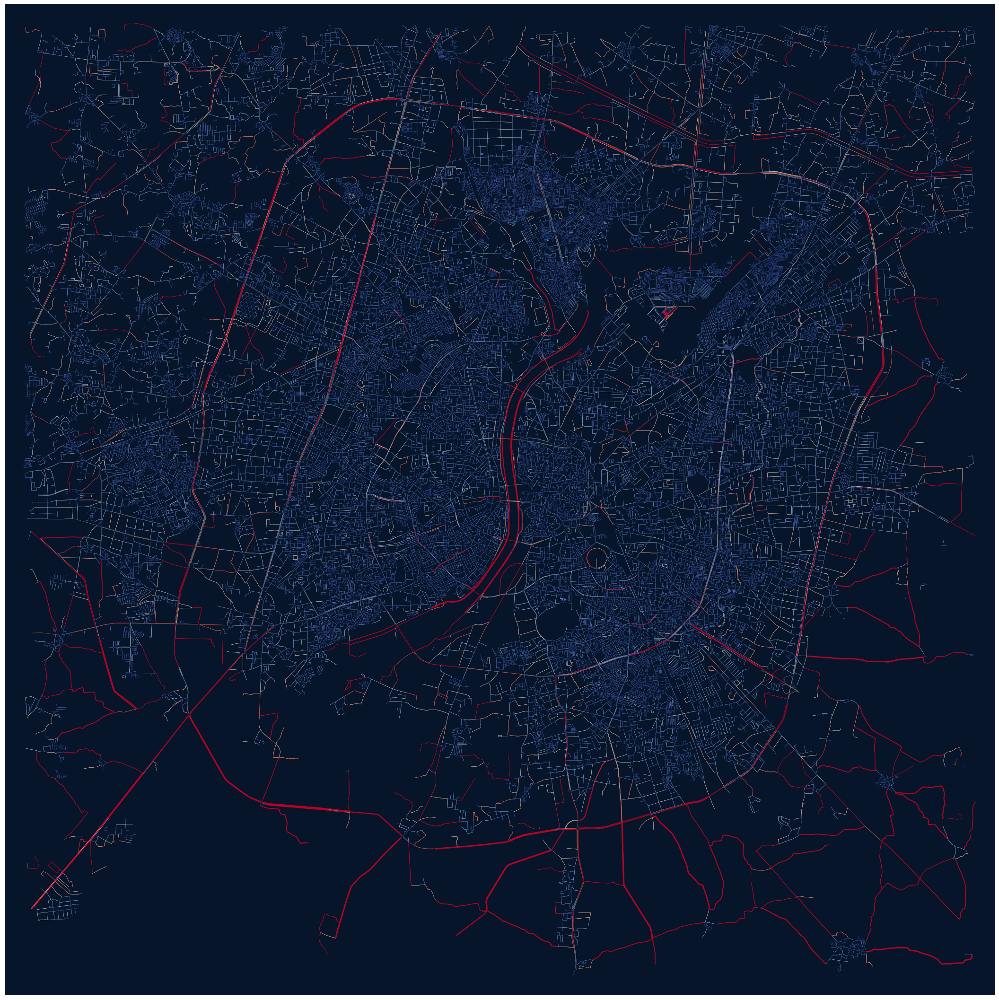

c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:85: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


<Figure size 640x480 with 0 Axes>

In [1]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import os
import matplotlib.cm as cm

# Define city/cities

# Get data for places

'''
places = ["Ahmedabad, India"]
G = ox.graph_from_place(places,  retain_all=True, simplify=True, network_type='all')
'''

point = (23.0225, 72.5714)
G = ox.graph_from_point(point, dist=15000, retain_all=True, simplify=True, network_type='all')

u, v, key, data = zip(*[(uu, vv, kkey, ddata) for uu, vv, kkey, ddata in G.edges(keys=True, data=True)])

# List to store colors and widths
roadColors = []
roadWidths = []

length_min = 0
length_max = 800
colormap = cm.get_cmap('coolwarm')

for item in data:
    length = item.get('length', length_min)
    color = colormap((length - length_min) / (length_max - length_min))
    width = 0.1 + 0.35 * (length - length_min) / (length_max - length_min)
    roadColors.append(color)
    roadWidths.append(width)

# Center of map
latitude = 23.0225
longitude = 72.5714

bgcolor = "#061529"

fig, ax = ox.plot_graph(G, node_size=0, figsize=(27, 40), dpi=300, bgcolor=bgcolor,
                        save=False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1)

Gwater = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all',
                            simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False,
                            custom_filter='["natural"~"water|waterway"]')

u, v, key, data = zip(*[(uu, vv, kkey, ddata) for uu, vv, kkey, ddata in Gwater.edges(keys=True, data=True)])

# List to store colors
roadColors = []
roadWidths = []

# #72b1b1
# #5dc1b9
for item in data:
    if "name" in item.keys():
        if item["length"] > 1000: 
            color = "#72b1b1"
            linewidth = 2.5
        elif item["length"] > 400:
            color = "#72b1b1"
            linewidth = 1.3
        else:
            color = "#72b1b1"
            linewidth = 0.9
    else:
        color = "#72b1b1"
        linewidth = 0.5
    roadColors.append(color)    
    roadWidths.append(linewidth)



fig, ax = ox.plot_graph(Gwater, node_size=0,figsize=(27, 40), 
                        dpi = 300, save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1, ax=ax)

fig.tight_layout(pad=0)
#Saves both city and roadmap
fig.savefig("Ahmedabad_city_and_waterMap_trial.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=True)


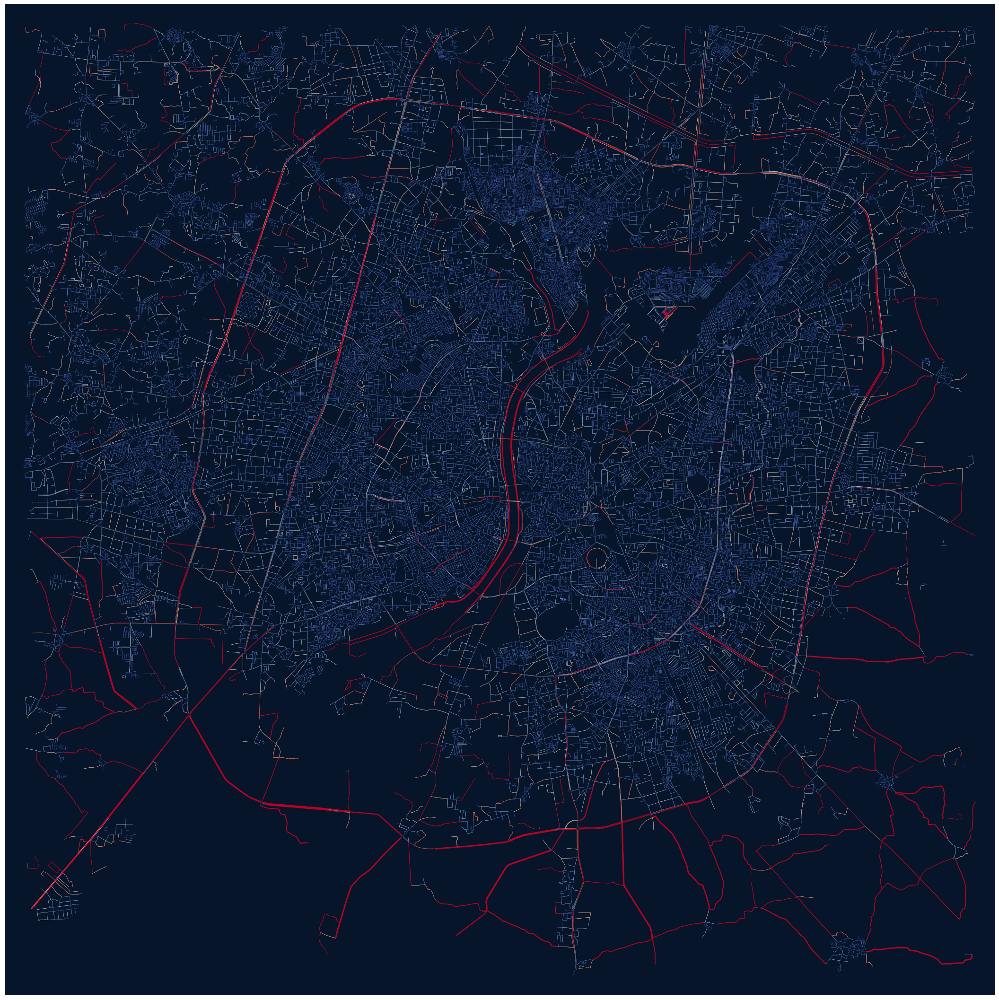

c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:85: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


<Figure size 640x480 with 0 Axes>

In [4]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import os
import matplotlib.cm as cm

point = (23.0225, 72.5714)
G = ox.graph_from_point(point, dist=15000, retain_all=True, simplify=True, network_type='all')

u, v, key, data = zip(*[(uu, vv, kkey, ddata) for uu, vv, kkey, ddata in G.edges(keys=True, data=True)])

# List to store colors and widths for roads
roadColors = []
roadWidths = []

length_min = 0
length_max = 800
colormap = cm.get_cmap('coolwarm')

for item in data:
    length = item.get('length', length_min)
    color = colormap((length - length_min) / (length_max - length_min))
    width = 0.1 + 0.35 * (length - length_min) / (length_max - length_min)
    roadColors.append(color)
    roadWidths.append(width)

# Center of map
latitude = 23.0225
longitude = 72.5714

bgcolor = "#061529"

fig, ax = ox.plot_graph(G, node_size=0, figsize=(27, 40), dpi=300, bgcolor=bgcolor,
                        save=False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1)

Gwater = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all',
                            simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False,
                            custom_filter='["natural"~"water|waterway"]')

u, v, key, data = zip(*[(uu, vv, kkey, ddata) for uu, vv, kkey, ddata in Gwater.edges(keys=True, data=True)])

# List to store colors and widths for water features
waterColors = []
waterWidths = []

for item in data:
    if "name" in item.keys():
        if item["length"] > 1000:
            color = "#72b1b1"
            linewidth = 5
        elif item["length"] > 400:
            color = "#72b1b1"
            linewidth = 3
        else:
            color = "#72b1b1"
            linewidth = 1.5
    else:
        color = "#72b1b1"
        linewidth = 1
    waterColors.append(color)
    waterWidths.append(linewidth)

# Plot water features with filled lakes
fig, ax = ox.plot_graph(Gwater, node_size=0, figsize=(27, 40),
                        dpi=300, save=False, edge_color=waterColors,
                        edge_linewidth=waterWidths, edge_alpha=1, ax=ax)

# Fill lakes with the same color as rivers
for feature in Gwater.nodes(data=True):
    if 'natural' in feature[1] and feature[1]['natural'] == 'water':
        ax.add_patch(plt.Circle((feature[1]['x'], feature[1]['y']), 100, color='#72b1b1'))

fig.tight_layout(pad=0)
# Save both city and water map
fig.savefig("Ahmedabad_city_and_waterMap_trial.png", dpi=300, bbox_inches='tight',
            format="png", facecolor=fig.get_facecolor(), transparent=True)

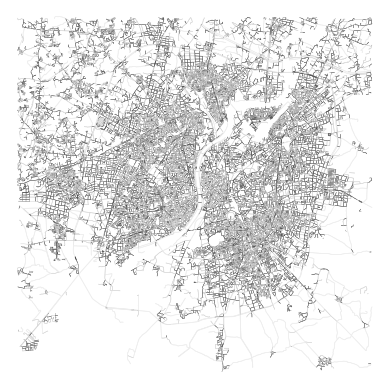

c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:85: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(
c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:85: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


<Figure size 640x480 with 0 Axes>

In [5]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Define city/cities

# Get data for places

'''
places = ["Ahmedabad, India"]
G = ox.graph_from_place(places,  retain_all=True, simplify=True, network_type='all')
'''

point = (23.0225, 72.5714)
G = ox.graph_from_point(point, dist=15000, retain_all=True, simplify=True, network_type='all')

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in G.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    

# List to store colors and widths
roadColors = []
roadWidths = []

for item in data:
    if "length" in item.keys():
        if item["length"] <= 100:
            linewidth = 0.10
            color = "#a6a6a6" 
        elif item["length"] > 100 and item["length"] <= 200:
            linewidth = 0.15
            color = "#676767"
        elif item["length"] > 200 and item["length"] <= 400:
            linewidth = 0.25
            color = "#454545"
        elif item["length"] > 400 and item["length"] <= 800:
            color = "#d5d5d5"
            linewidth = 0.35
        else:
            color = "#ededed"
            linewidth = 0.45
    else:
        color = "#a6a6a6"
        linewidth = 0.10
    roadColors.append(color)
    roadWidths.append(linewidth)
            

# Center of map
latitude = 23.0225
longitude = 72.5714

bgcolor = "#061529"

fig, ax = plt.subplots()

fig, ax = ox.plot_graph(G, node_size=0, figsize=(27, 40), dpi=300, bgcolor=bgcolor,
                        save=False, edge_color=roadColors, edge_linewidth=roadWidths, edge_alpha=1, ax=ax)


fig.tight_layout(pad=0)
# Saves only the road map
fig.savefig("Ahmedabad_roadMap.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=False)


G1 = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["natural"~"water"]')
G2 = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["waterway"~"river|canal|lake"]')

Gwater = nx.compose(G1, G2)

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in Gwater.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    


# List to store colors and widths
roadColors = []
roadWidths = []

for item in data:
    if "name" in item.keys():
        if item["length"] > 1000: 
            color = "#72b1b1"
            linewidth = 2.5
        elif item["length"] > 400:
            color = "#72b1b1"
            linewidth = 1.3
        else:
            color = "#72b1b1"
            linewidth = 0.9
    else:
        color = "#72b1b1"
        linewidth = 0.5
    roadColors.append(color)    
    roadWidths.append(linewidth)


fig, ax = ox.plot_graph(Gwater, node_size=0, figsize=(27, 40), dpi=300, save=False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1, ax=ax)

fig.tight_layout(pad=0)
# Saves both the city and water map
fig.savefig("Ahmedabad_city_and_waterMap_trial_1.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=True)

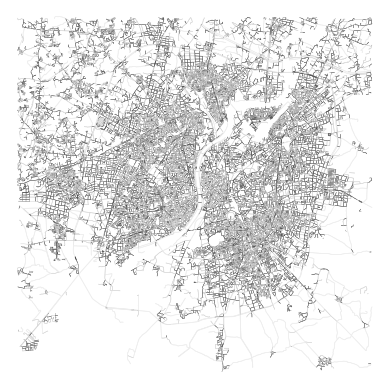

c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:88: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(
c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:88: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


<Figure size 640x480 with 0 Axes>

In [1]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Define city/cities

# Get data for places

'''
places = ["Ahmedabad, India"]
G = ox.graph_from_place(places,  retain_all=True, simplify=True, network_type='all')
'''

point = (23.0225, 72.5714)
G = ox.graph_from_point(point, dist=15000, retain_all=True, simplify=True, network_type='all')

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in G.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    

# List to store colors and widths
roadColors = []
roadWidths = []

riverColors = []
riverWidths = []

canalColors = []
canalWidths = []

for item in data:
    if "length" in item.keys():
        if "waterway" in item.keys():
            if item["waterway"] == "river":
                if item["length"] > 1000:
                    riverColor = "#72b1b1"
                    riverWidth = 2.5
                elif item["length"] > 400:
                    riverColor = "#72b1b1"
                    riverWidth = 1.3
                else:
                    riverColor = "#72b1b1"
                    riverWidth = 0.9
                riverColors.append(riverColor)
                riverWidths.append(riverWidth)
            elif item["waterway"] == "canal":
                if item["length"] > 1000:
                    canalColor = "#ff0000"  # Example color for canal
                    canalWidth = 1.8  # Example width for canal
                elif item["length"] > 400:
                    canalColor = "#ff0000"  # Example color for canal
                    canalWidth = 1.2  # Example width for canal
                else:
                    canalColor = "#ff0000"  # Example color for canal
                    canalWidth = 0.8  # Example width for canal
                canalColors.append(canalColor)
                canalWidths.append(canalWidth)
        else:
            if item["length"] <= 100:
                linewidth = 0.10
                color = "#a6a6a6" 
            elif item["length"] > 100 and item["length"] <= 200:
                linewidth = 0.15
                color = "#676767"
            elif item["length"] > 200 and item["length"] <= 400:
                linewidth = 0.25
                color = "#454545"
            elif item["length"] > 400 and item["length"] <= 800:
                color = "#d5d5d5"
                linewidth = 0.35
            else:
                color = "#ededed"
                linewidth = 0.45
            roadColors.append(color)
            roadWidths.append(linewidth)
            

# Center of map
latitude = 23.0225
longitude = 72.5714

bgcolor = "#061529"

fig, ax = plt.subplots()

fig, ax = ox.plot_graph(G, node_size=0, figsize=(27, 40), dpi=300, bgcolor=bgcolor,
                        save=False, edge_color=roadColors, edge_linewidth=roadWidths, edge_alpha=1, ax=ax)


fig.tight_layout(pad=0)
# Saves only the road map
fig.savefig("Ahmedabad_roadMap.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=False)


G1 = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["natural"~"water"]')
G2 = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["waterway"~"river|canal|lake"]')

Gwater = nx.compose(G1, G2)

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in Gwater.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    


# Lists to store colors and widths
roadColors = []
roadWidths = []
riverColors = []
riverWidths = []
canalColors = []
canalWidths = []

for item in data:
    if "length" in item.keys():
        if "waterway" in item.keys():
            if item["waterway"] == "river":
                if item["length"] > 1000:
                    riverColor = "#72b1b1"
                    riverWidth = 2.5
                elif item["length"] > 400:
                    riverColor = "#72b1b1"
                    riverWidth = 1.3
                else:
                    riverColor = "#72b1b1"
                    riverWidth = 0.9
                riverColors.append(riverColor)
                riverWidths.append(riverWidth)
                canalColors.append(None)
                canalWidths.append(None)
                roadColors.append(None)
                roadWidths.append(None)
            elif item["waterway"] == "canal":
                if item["length"] > 1000:
                    canalColor = "#72b1b1"  # Example color for canal
                    canalWidth = 1.8  # Example width for canal
                elif item["length"] > 400:
                    canalColor = "#72b1b1"  # Example color for canal
                    canalWidth = 1.2  # Example width for canal
                else:
                    canalColor = "#72b1b1"  # Example color for canal
                    canalWidth = 0.8  # Example width for canal
                canalColors.append(canalColor)
                canalWidths.append(canalWidth)
                riverColors.append(None)
                riverWidths.append(None)
                roadColors.append(None)
                roadWidths.append(None)
            else:
                roadColors.append("#a6a6a6")
                roadWidths.append(0.10)
                riverColors.append(None)
                riverWidths.append(None)
                canalColors.append(None)
                canalWidths.append(None)
        else:
            roadColors.append("#a6a6a6")
            roadWidths.append(0.10)
            riverColors.append(None)
            riverWidths.append(None)
            canalColors.append(None)
            canalWidths.append(None)
    else:
        roadColors.append("#a6a6a6")
        roadWidths.append(0.10)
        riverColors.append(None)
        riverWidths.append(None)
        canalColors.append(None)
        canalWidths.append(None)

fig, ax = ox.plot_graph(Gwater, node_size=0, figsize=(27, 40), dpi=300, save=False, edge_color=[color for color in roadColors if color is not None],
                        edge_linewidth=[width for width in roadWidths if width is not None], edge_alpha=1, ax=ax)

if riverColors:
    river_widths_filtered = [width for width in riverWidths if width is not None]
    if river_widths_filtered:
        max_river_width = max(river_widths_filtered)
        fig, ax = ox.plot_graph(Gwater, node_size=0, figsize=(27, 40), dpi=300, save=False, edge_color=riverColors,
                                edge_linewidth=riverWidths, edge_alpha=1, ax=ax)
else:
    max_river_width = 0.5

if canalColors:
    canal_widths_filtered = [width for width in canalWidths if width is not None]
    if canal_widths_filtered:
        max_canal_width = max(canal_widths_filtered)
        fig, ax = ox.plot_graph(Gwater, node_size=0, figsize=(27, 40), dpi=300, save=False, edge_color=canalColors,
                                edge_linewidth=canalWidths, edge_alpha=1, ax=ax)
else:
    max_canal_width = 0.5



fig.tight_layout(pad=0)
# Saves both the city and water map
fig.savefig("Ahmedabad_city_and_waterMap_trial1.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=True)


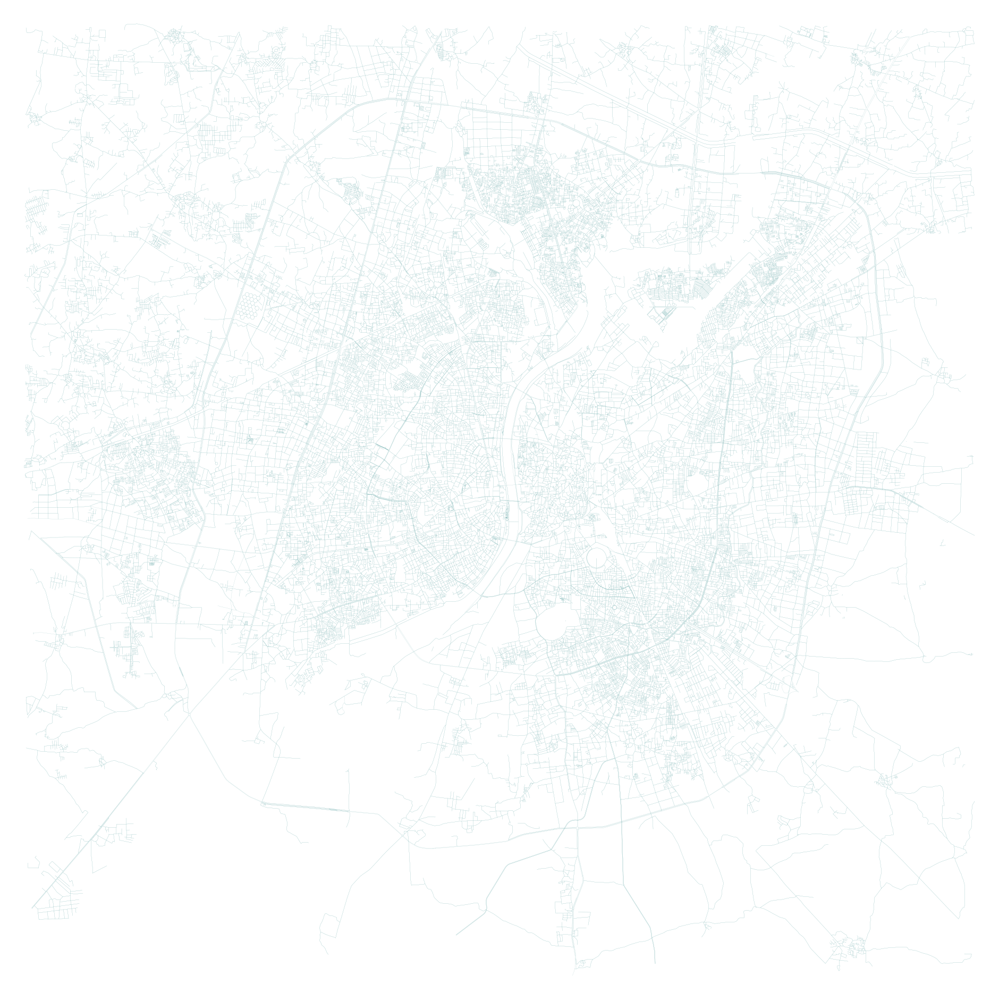

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [8]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt

# Define city/cities
point = (23.0225, 72.5714)
G = ox.graph_from_point(point, dist=15000, retain_all=True, simplify=True, network_type='all')

# Create separate graphs for rivers and canals
G_rivers = G.copy()
G_canals = G.copy()

# Set widths for rivers and canals
for u, v, k, data in G_rivers.edges(keys=True, data=True):
    if 'waterway' in data and 'river' in data['waterway']:
        data['width'] = 2.5  # Set width for rivers
    else:
        data['width'] = 0.1  # Set a small width for other edges

for u, v, k, data in G_canals.edges(keys=True, data=True):
    if 'waterway' in data and 'canal' in data['waterway']:
        data['width'] = 1.5  # Set width for canals
    else:
        data['width'] = 0.1  # Set a small width for other edges

# Plot the graphs with different widths for rivers and canals
fig, ax = plt.subplots(figsize=(24, 40))

# Get the widths as a dictionary for rivers and canals
rivers_width = nx.get_edge_attributes(G_rivers, 'width')
canals_width = nx.get_edge_attributes(G_canals, 'width')

# Plot rivers with their respective widths and colors
ox.plot_graph(G_rivers, ax=ax, node_size=0, edge_linewidth=list(rivers_width.values()), edge_color='#72b1b1')

# Plot canals with their respective widths and colors
ox.plot_graph(G_canals, ax=ax, node_size=0, edge_linewidth=list(canals_width.values()), edge_color='#007f7f')

plt.tight_layout()
plt.show()

In [12]:
import osmnx as ox
import matplotlib.pyplot as plt

# Define the bounding box coordinates
north, south, east, west = 37.79, 37.78, -122.41, -122.43

# Download the road network
G = ox.graph_from_bbox(north, south, east, west, network_type='all')

# Download the water network (rivers)
G_rivers = ox.graph_from_bbox(north, south, east, west, network_type='all', custom_filter='["waterway"~"river"]')

# Download the water network (canals)
G_canals = ox.graph_from_bbox(north, south, east, west, network_type='all', custom_filter='["waterway"~"canal"]')

# Plot the road network
fig, ax = ox.plot_graph(G, node_size=0, edge_color='gray', edge_linewidth=0.5, show=False)

# Plot rivers with their respective widths and colors
ox.plot_graph(G_rivers, ax=ax, node_size=0, edge_linewidth=ox.plot.get_edge_colors_by_attr(G_rivers, 'width'), edge_color='#72b1b1')

# Plot canals with their respective widths and colors
ox.plot_graph(G_canals, ax=ax, node_size=0, edge_linewidth=ox.plot.get_edge_colors_by_attr(G_canals, 'width'), edge_color='#72b1b1')

# Display the plot
plt.show()

EmptyOverpassResponse: There are no data elements in the server response. Check log and query location/filters.

In [16]:
# Visualizing Ahmedabad

import osmnx as ox
import networkx as nx

# Define city/cities

# Get data for places

'''
places = ["Ahmedabad, India"]
G = ox.graph_from_place(places,  retain_all=True, simplify = True, network_type='all')
'''

point = (23.0225, 72.5714)
# Center of map
latitude = 23.0225
longitude = 72.5714

bgcolor = "#061529"

G = ox.graph_from_point(point, dist=15000, retain_all=True, simplify = True, network_type='all')

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in G.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    

# List to store colors
roadColors = []
roadWidths = []

for item in data:
    if "length" in item.keys():
        if item["length"] <= 100:
            linewidth = 0.10
            color = "#a6a6a6" 
            
        elif item["length"] > 100 and item["length"] <= 200:
            linewidth = 0.15
            color = "#676767"
            
        elif item["length"] > 200 and item["length"] <= 400:
            linewidth = 0.25
            color = "#454545"
            
        elif item["length"] > 400 and item["length"] <= 800:
            color = "#d5d5d5"
            linewidth = 0.35
        else:
            color = "#ededed"
            linewidth = 0.45
    else:
        color = "#a6a6a6"
        linewidth = 0.10
            
    roadColors.append(color)
    roadWidths.append(linewidth)
            



fig, ax = ox.plot_graph(G, node_size=0,figsize=(27, 40), 
                        dpi = 300,bgcolor = bgcolor,
                        save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1, ax=ax)

'''
# Bbox sides
north = latitude + 0.15
south = latitude - 0.15
east = longitude + 0.15
west = longitude - 0.15

fig, ax = ox.plot_graph(G, node_size=0, bbox = (north, south, east, west),
                        dpi = 300,bgcolor = bgcolor,
                        save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1)

'''

fig.tight_layout(pad=0)
#Saves only roadmap
#fig.savefig("Ahmedabad_roadMap.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=False)




G1 = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["natural"~"water"]')
G2 = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["waterway"~"river"]')
Gwater = nx.compose(G1, G2)


u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in Gwater.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    


# List to store colors
roadColors = []
roadWidths = []

# #72b1b1
# #5dc1b9
for item in data:
    if "name" in item.keys():
        if item["length"] > 400: 
            color = "#5dc1b9"
            linewidth = 5
        else:
            color = "#5dc1b9"
            linewidth = 1.25
    else:
        color = "#5dc1b9"
        linewidth = 0.5
    roadColors.append(color)    
    roadWidths.append(linewidth)



fig, ax = ox.plot_graph(Gwater, node_size=0,figsize=(27, 40), 
                        dpi = 300, save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1, ax=ax)


G3 = ox.graph_from_point(point, dist=15000, dist_type='bbox', network_type='all', 
                        simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["waterway"~"canal"]')

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in G3.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)    


# List to store colors
roadColors = []
roadWidths = []

# #72b1b1
# #5dc1b9
for item in data:
    if "name" in item.keys():
        if item["length"] > 400: 
            color = "#5dc1b9"
            linewidth = 2.5
        else:
            color = "#5dc1b9"
            linewidth = 1
    else:
        color = "#5dc1b9"
        linewidth = 0.5
    roadColors.append(color)    
    roadWidths.append(linewidth)



fig, ax = ox.plot_graph(G3, node_size=0,figsize=(27, 40), 
                        dpi = 300, save = False, edge_color=roadColors,
                        edge_linewidth=roadWidths, edge_alpha=1, ax=ax)




fig.tight_layout(pad=0)
fig.savefig("Ahmedabad_city_and_waterMap_1.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=True)

<Figure size 640x480 with 0 Axes>

c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:88: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(
c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:88: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


<Figure size 640x480 with 0 Axes>

c:\Users\purva\anaconda3\lib\site-packages\osmnx\graph.py:88: UserWarning: the graph-level street_count attribute will likely be inaccurate when you set clean_periphery=False
  G = graph_from_polygon(


<Figure size 640x480 with 0 Axes>

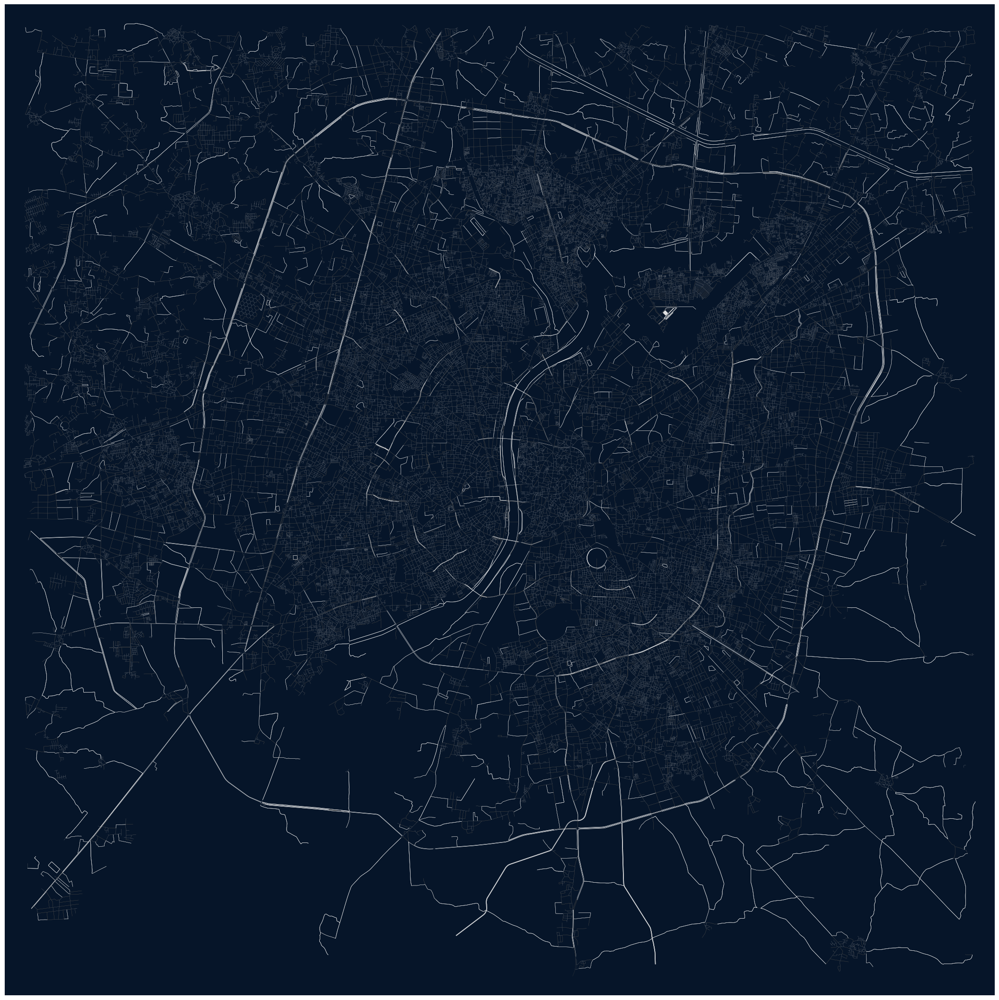

C:\Users\purva\AppData\Local\Temp\ipykernel_4080\730849175.py:76: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  parks_and_gardens = ox.geometries_from_bbox(north, south, east, west, tags=tags)
C:\Users\purva\AppData\Local\Temp\ipykernel_4080\730849175.py:83: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if shape.type == "Polygon":
C:\Users\purva\AppData\Local\Temp\ipykernel_4080\730849175.py:85: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  elif shape.type == "MultiPolygon":


ValueError: not enough values to unpack (expected 2, got 0)

In [5]:
import osmnx as ox
import networkx as nx
from shapely.geometry import Polygon
import matplotlib.pyplot as plt

# Define city/cities

# Get data for places

'''
places = ["Ahmedabad, India"]
G = ox.graph_from_place(places, retain_all=True, simplify=True, network_type='all')
'''

point = (23.0225, 72.5714)
# Center of map
latitude = 23.0225
longitude = 72.5714

bgcolor = "#061529"

G = ox.graph_from_point(point, dist=15000, retain_all=True, simplify=True, network_type='all')

u = []
v = []
key = []
data = []
for uu, vv, kkey, ddata in G.edges(keys=True, data=True):
    u.append(uu)
    v.append(vv)
    key.append(kkey)
    data.append(ddata)

# List to store colors
roadColors = []
roadWidths = []

for item in data:
    if "length" in item.keys():
        if item["length"] <= 100:
            linewidth = 0.10
            color = "#a6a6a6"

        elif item["length"] > 100 and item["length"] <= 200:
            linewidth = 0.15
            color = "#676767"

        elif item["length"] > 200 and item["length"] <= 400:
            linewidth = 0.25
            color = "#454545"

        elif item["length"] > 400 and item["length"] <= 800:
            color = "#d5d5d5"
            linewidth = 0.35
        else:
            color = "#ededed"
            linewidth = 0.45
    else:
        color = "#a6a6a6"
        linewidth = 0.10

    roadColors.append(color)
    roadWidths.append(linewidth)

fig, ax = ox.plot_graph(G, node_size=0, figsize=(27, 40), dpi=300, bgcolor=bgcolor,
                        save=False, edge_color=roadColors, edge_linewidth=roadWidths, edge_alpha=1, ax=None)

# Define the bounding box coordinates
north = latitude + 0.05
south = latitude - 0.05
east = longitude + 0.05
west = longitude - 0.05

# Extract park and garden polygons within the bounding box
tags = {"leisure": ["park", "garden"]}
parks_and_gardens = ox.geometries_from_bbox(north, south, east, west, tags=tags)

if not parks_and_gardens.empty:
    # Plot park and garden polygons on the map
    park_color = "#008000"  # Green color for parks
    for _, pg in parks_and_gardens.iterrows():
        shape = pg["geometry"]
        if shape.type == "Polygon":
            ax.add_patch(plt.Polygon(shape.exterior, facecolor=park_color, edgecolor=None, alpha=0.5))
        elif shape.type == "MultiPolygon":
            for polygon in shape:
                ax.add_patch(plt.Polygon(polygon.exterior, facecolor=park_color, edgecolor=None, alpha=0.5))
else:
    print("No park or garden geometries found in the specified area.")

fig.tight_layout(pad=0)
plt.show()

C:\Users\purva\AppData\Local\Temp\ipykernel_4080\1546527969.py:17: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  water = ox.geometries_from_polygon(poly, tags={'landuse': 'forest'})


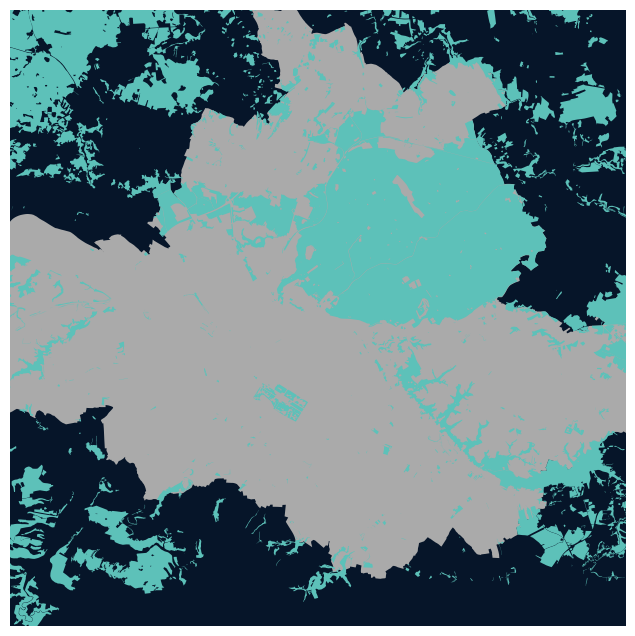

In [23]:
import osmnx as ox

# point = (51.050407, 13.737262)
# # Center of map
# latitude = 51.050407
# longitude = 13.737262

# bgcolor = "#061529"

places = ['Dresden, Saxony, Germany']
land = ox.geocode_to_gdf(places)

# get the water bodies
left, bottom, right, top = land.total_bounds
bbox = top, bottom, right, left
poly = ox.utils_geo.bbox_to_poly(*bbox)
water = ox.geometries_from_polygon(poly, tags={'landuse': 'forest'})


# constrain the plotting window as desired
c = land.unary_union.centroid
bbox = ox.utils_geo.bbox_from_point((c.y, c.x), dist=12000)

water_color = '#5dc1b9'
land_color = '#aaaaaa'
fig, ax = ox.plot_footprints(water, bbox=bbox,
                             color=water_color, bgcolor='#061529',
                             show=False, close=False)
ax = land.plot(ax=ax, zorder=0, fc=land_color)

# G1 = ox.graph_from_point(point, dist=7500, dist_type='bbox', network_type='all', 
#                         simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["natural"~"wood|grassland|wetland"]')
# G2 = ox.graph_from_point(point, dist=7500, dist_type='bbox', network_type='all', 
#                         simplify=True, retain_all=True, truncate_by_edge=False, clean_periphery=False, custom_filter='["landuse"~"forest|grass|vineyard"]')
# Gwater = nx.compose(G1, G2)


# u = []
# v = []
# key = []
# data = []
# for uu, vv, kkey, ddata in Gwater.edges(keys=True, data=True):
#     u.append(uu)
#     v.append(vv)
#     key.append(kkey)
#     data.append(ddata)    


# # List to store colors
# roadColors = []
# roadWidths = []

# # #72b1b1
# # #5dc1b9
# for item in data:
#     if "name" in item.keys():
#         if item["length"] > 400: 
#             color = "#5dc1b9"
#             linewidth = 5
#         else:
#             color = "#5dc1b9"
#             linewidth = 1.25
#     else:
#         color = "#5dc1b9"
#         linewidth = 0.5
#     roadColors.append(color)    
#     roadWidths.append(linewidth)



# fig, ax = ox.plot_footprints(Gwater, save = False, edge_color=roadColors,
#                         edge_linewidth=roadWidths)

# fig.tight_layout(pad=0)
# fig.savefig("Dresden_city_green.png", dpi=300, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=True)

C:\Users\purva\AppData\Local\Temp\ipykernel_4080\1242638761.py:20: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  grass_area = ox.geometries_from_point(point, dist=10000, tags={'landuse': 'grass'})


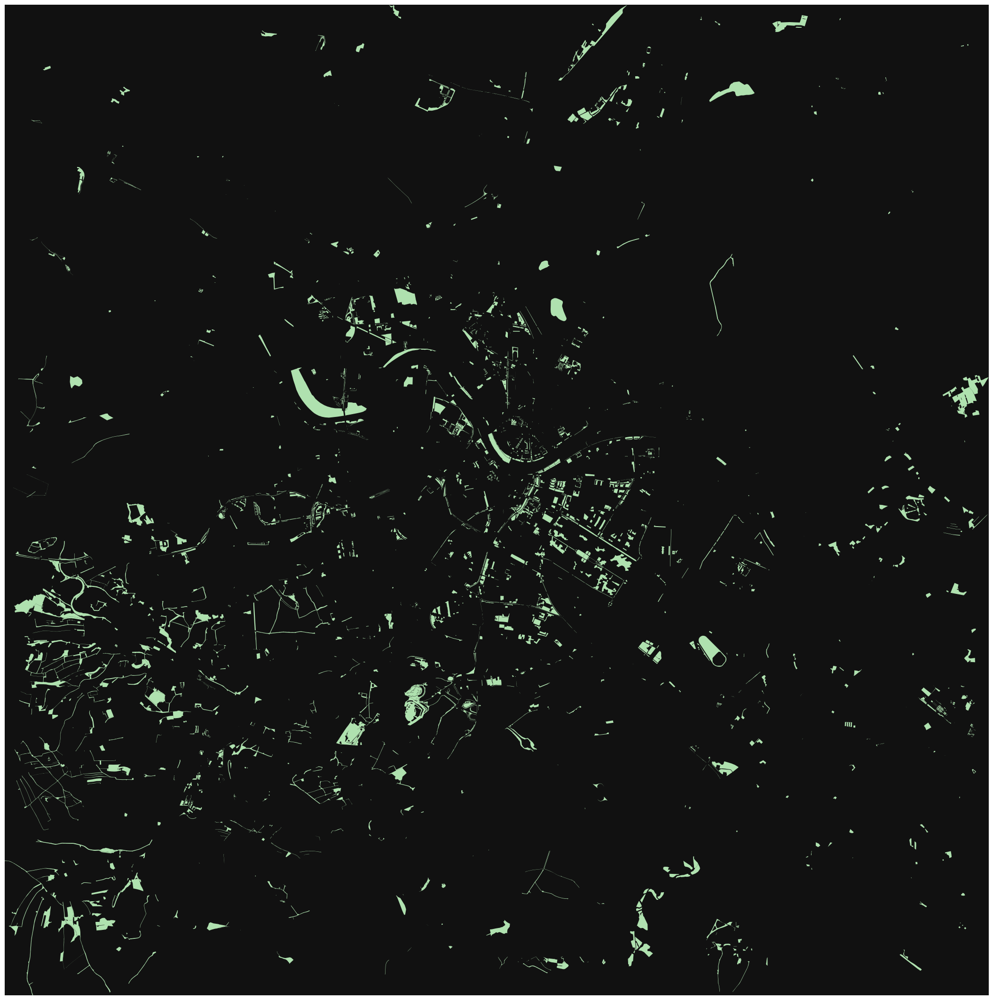

In [30]:
import osmnx as ox
import networkx as nx

# Define city/cities

# Get data for places

'''
places = ["Dresden, DE"]
G = ox.graph_from_place(places,  retain_all=True, simplify = True, network_type='all')
'''

point = (51.050407, 13.737262)
# Center of map
latitude = 51.050407
longitude = 13.737262

bgcolor = "#061529"

grass_area = ox.geometries_from_point(point, dist=10000, tags={'landuse': 'grass'})

grass_color = '#afe1af'

fig, ax = ox.plot.plot_footprints(grass_area, figsize=(27, 40), dpi=300, save=False, color=grass_color)


fig.tight_layout(pad=0)
fig.savefig("Dresden_city_grass.png", dpi=600, bbox_inches='tight', format="png", facecolor=fig.get_facecolor(), transparent=True)